<a href="https://colab.research.google.com/github/yl642/BME-590-Machine-Learning-in-Imaging/blob/master/Copy_of_ml_final_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
try:
  %tensorflow_version 2.x
except:
  pass

In [0]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
print(tf.__version__)

2.2.0-rc2


In [0]:
tf.test.gpu_device_name()

'/device:GPU:0'

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
# ONLY run for the first time
#!unzip "/content/drive/My Drive/HAM10000_images.zip" -d "/content/drive/My Drive/HAM10000_images/"

In [0]:
# load labels

import csv

filename = '/content/drive/My Drive/HAM10000_metadata.csv'
try:
  trial = open(filename, 'r')
except IOError:
  print('There was an error reading the file!')

content = []

with open(filename, 'r') as csv_file:
  csv_reader = csv.reader(csv_file)
  for line in csv_reader:
    content.append(line)
print(len(content))
print(content[0])
print(content[1])
del line, csv_file

10016
['lesion_id', 'image_id', 'dx', 'dx_type', 'age', 'sex', 'localization']
['HAM_0000118', 'ISIC_0027419', 'bkl', 'histo', '80.0', 'male', 'scalp']


In [0]:
# two ways to get filenames ## not used in fact
# from glob import glob
# s = "/content/drive/My Drive/HAM10000_images/HAM10000_images_part_1"
# Files = glob(s + '/*.jpg')
# print(len(Files))
# print(Files[0])

In [0]:
## not used in fact
# import os
# %cd "/content/drive/My Drive/"
# !pwd
# iFiles = os.listdir("/content/drive/My Drive/HAM10000_images/HAM10000_images_part_1/")
# print(len(iFiles))
# print(iFiles[0])

In [0]:
# read files in order of labels
labels = []
files = []
for i in range(1, len(content)):
  files.append("/content/drive/My Drive/HAM10000_images/HAM10000_images_part_1/" + content[i][1] + ".jpg")
  labels.append(content[i][2])

print(len(files), files[1])
print(len(labels), labels[1])
del content, i

10015 /content/drive/My Drive/HAM10000_images/HAM10000_images_part_1/ISIC_0025030.jpg
10015 bkl


In [0]:
# only run for the first time

# sample = plt.imread(files[0])
# print(sample.shape)
# images = np.zeros((len(files), 90, 120, 3), dtype=int)  # 450/5=90; 600/5=120, sort of pre-processing
# print(images.shape)
# plt.imshow(sample)
# plt.show()
# resize_sample = tf.image.resize(sample, (90, 120)).numpy().astype(int)
# plt.imshow(resize_sample)
# plt.show()

# # for i in range(0, 10):  # for test
# for i in range(0, len(files)):
#   sample = plt.imread(files[i])
#   resize_sample = tf.image.resize(sample, (90, 120)).numpy()
#   resize_sample = resize_sample.astype(int)
#   images[i] = resize_sample

In [0]:
# loading variables
import pickle
filename = '/content/drive/My Drive/images_resized.pickle'
with open(filename, "rb") as f:
  images = pickle.load(f)
del f

In [0]:
# # not necessary
# fig = plt.figure(figsize=(20, 5))
# for i in range(10):
#   fig.add_subplot(1, 10, i+1)
#   plt.imshow(images[i*1000])
# plt.suptitle('Resiezed Figures', size="xx-large")
# plt.tight_layout(rect=[0, 0.03, 1, 0.97])

# fig = plt.figure(figsize=(20, 5))
# for i in range(10):
#   sample = plt.imread(files[i*1000])
#   fig.add_subplot(1, 10, i+1)
#   plt.imshow(sample)
# plt.suptitle('Original Figures', size="xx-large")
# plt.tight_layout(rect=[0, 0.03, 1, 0.97])

# del i

In [0]:
# saving variables
# import pickle
# filename = '/content/drive/My Drive/images_resized.pickle'
# with open(filename, "wb") as f:
#   pickle.dump(images, f)

In [0]:
types = {'bkl': 0, 'akiec': 1, 'bcc': 2, 'df': 3, 'mel': 4, 'nv': 5, 'vasc': 6}
for i in range(len(labels)):
  for key in types.keys():
    if key == labels[i]:
      labels[i] = types[key]

In [0]:
# # label shrinkage if needed, not necessary

# labels = np.array(labels)
# images = np.array(images)
# labels_idx = np.where(labels != 3)
# labels = labels[labels_idx]
# images = images[labels_idx]

# labels_idx = np.where(labels != 6)
# labels = labels[labels_idx]
# images = images[labels_idx]

# types = {'bkl': 0, 'akiec': 1, 'bcc': 2, 'mel': 3, 'nv': 4}

# for i in range(len(labels)):
#     if labels[i] == 4:
#       labels[i] = 3
#     if labels[i] == 5:
#       labels[i] = 4

In [0]:
# randomization
import random
mapIndexPosition = list(zip(images, labels))
random.shuffle(mapIndexPosition)
rimages, rlabels = zip(*mapIndexPosition)
rimages = np.array(rimages)
rlabels = np.array(rlabels)
print(rimages.shape)

del images, labels, mapIndexPosition

# randomization twice

mapIndexPosition = list(zip(rimages, rlabels))
random.shuffle(mapIndexPosition)
rimages, rlabels = zip(*mapIndexPosition)
rimages = np.array(rimages)
rlabels = np.array(rlabels)
print(rimages.shape)

del mapIndexPosition

(10015, 90, 120, 3)
(10015, 90, 120, 3)


In [0]:
# uneven_distribution?
types_size = np.zeros((7))

for i in rlabels:
  types_size[i] += 1

print(types_size/sum(types_size)*100)
print(types_size/sum(types_size)*128)

[10.97353969  3.26510235  5.13230155  1.14827758 11.11333    66.94957564
  1.41787319]
[14.0461308   4.179331    6.56934598  1.46979531 14.22506241 85.69545681
  1.81487768]


In [0]:
# perform balanced batching ...

In [0]:
# tf.data API

x_train = rimages[0:8500]
y_train = rlabels[0:8500]
x_test = rimages[8500:rimages.shape[0]]
y_test = rlabels[8500:rimages.shape[0]]

x_train_mean = np.mean(x_train)
x_train_std = np.std(x_train)

x_test_mean = np.mean(x_test)
x_test_std = np.std(x_test)

x_train = (x_train - x_train_mean)/x_train_std
x_test = (x_test - x_test_mean)/x_test_std

# x_train, x_test = x_train/255.0, x_test/255.0
print(x_train.shape)
#################################
#           Data API            #
#################################
# tf.data  numpy array --> tensorflow tensor
train_ds = tf.data.Dataset.from_tensor_slices((x_train, y_train))
train_ds = train_ds.shuffle(8501)  # after a complete epoch
train_ds = train_ds.batch(128)  # in order to have presense of every label
test_ds = tf.data.Dataset.from_tensor_slices((x_test, y_test)).batch(128)

(8500, 90, 120, 3)


In [0]:
print(y_train[0:128])

[5 5 4 5 5 5 5 4 5 4 5 4 0 0 5 5 5 5 5 2 5 5 3 5 0 5 4 5 4 5 5 3 1 5 5 2 5
 2 5 5 2 0 2 5 5 5 5 5 5 5 5 5 5 5 2 2 5 5 5 5 5 5 5 5 5 5 1 5 5 5 5 0 5 0
 0 5 4 5 5 6 2 5 4 5 5 5 5 4 5 5 5 1 5 0 0 5 0 0 2 0 4 5 5 5 5 5 5 1 5 5 5
 4 5 5 5 3 5 5 5 0 5 5 2 5 4 5 2 0]


In [0]:
# w/o physical layer
#### Model Class ####

# class cnn_model(tf.keras.models.Model):  #  6-8 is the sweet point
#   def __init__(self):
#     super().__init__()
#     self.conv1 = tf.keras.layers.Conv2D(16, 3, padding="same", activation="relu")
#     self.conv2 = tf.keras.layers.Conv2D(16, 3, 2, padding="same", activation="relu")
#     self.noise = tf.keras.layers.GaussianNoise(0.2)  # noise regularization para: stddev
#     self.norm1 = tf.keras.layers.BatchNormalization()
#     self.conv3 = tf.keras.layers.Conv2D(16, 3, padding="same", activation="relu")
#     self.conv4 = tf.keras.layers.Conv2D(16, 3, 2, padding="same", activation="relu")
#     self.norm2 = tf.keras.layers.BatchNormalization()
#     self.flatten = tf.keras.layers.Flatten()
#     self.dense = tf.keras.layers.Dense(128, activation="relu")
#     self.drop = tf.keras.layers.GaussianDropout(0.2)  # dropout
#     self.out = tf.keras.layers.Dense(7, activation="softmax")

#   def call(self, x):
#     x = self.conv1(x)
#     x = self.conv2(x)
#     x = self.noise(x)  # noise regularization, decrease acc strongly
#     x = self.norm1(x)
#     x = self.conv3(x)
#     x = self.conv4(x)
#     x = self.norm2(x)
#     flat = self.flatten(x)
#     x = self.dense(flat)
#     x = self.drop(x)  # dropout
#     return self.out(x)

class cnn_model(tf.keras.models.Model):
  def __init__(self):
    super().__init__()
    self.conv1 = tf.keras.layers.Conv2D(64, 3, padding="same", activation="relu")
    self.maxpool1 = tf.keras.layers.MaxPool2D((2, 2), 2, padding='valid')
    self.norm1 = tf.keras.layers.BatchNormalization()
    self.conv2 = tf.keras.layers.Conv2D(128, 3, padding="same", activation="relu")
    self.maxpool2 = tf.keras.layers.MaxPool2D((2, 2), 2, padding='valid')
    self.norm2 = tf.keras.layers.BatchNormalization()
    self.drop1 = tf.keras.layers.Dropout(0.2)  # dropout
    self.conv3 = tf.keras.layers.Conv2D(256, 3, padding="same", activation="relu")
    self.conv4 = tf.keras.layers.Conv2D(256, 3, padding="same", activation="relu")
    self.conv5 = tf.keras.layers.Conv2D(256, 3, padding="same", activation="relu")
    self.maxpool3 = tf.keras.layers.MaxPool2D((2, 2), 2, padding='valid')
    self.norm3 = tf.keras.layers.BatchNormalization()
    self.drop2 = tf.keras.layers.Dropout(0.25)  # dropout
    self.conv6 = tf.keras.layers.Conv2D(512, 3, padding="same", activation="relu")
    self.conv7 = tf.keras.layers.Conv2D(512, 3, padding="same", activation="relu")
    self.conv8 = tf.keras.layers.Conv2D(512, 3, padding="same", activation="relu")
    self.maxpool4 = tf.keras.layers.MaxPool2D((2, 2), 2, padding='valid')
    self.norm4 = tf.keras.layers.BatchNormalization()
    self.conv9 = tf.keras.layers.Conv2D(512, 3, padding="same", activation="relu")
    self.conv10 = tf.keras.layers.Conv2D(512, 3, padding="same", activation="relu")
    self.conv11 = tf.keras.layers.Conv2D(512, 3, padding="same", activation="relu")
    self.maxpool5 = tf.keras.layers.MaxPool2D((2, 2), 2, padding='valid')
    self.norm5 = tf.keras.layers.BatchNormalization()
    self.drop3 = tf.keras.layers.Dropout(0.4)  # dropout
    self.flatten = tf.keras.layers.Flatten()
    self.dense1 = tf.keras.layers.Dense(4096, activation="relu")
    self.dense2 = tf.keras.layers.Dense(4096, activation="relu")
    self.drop4 = tf.keras.layers.Dropout(0.5)  # dropout
    self.out = tf.keras.layers.Dense(7, activation="softmax")

  def call(self, x):
    x = self.conv1(x)
    x = self.maxpool1(x)
    x = self.norm1(x)
    x = self.conv2(x)
    x = self.maxpool2(x)
    x = self.norm2(x)
    x = self.drop1(x)
    x = self.conv3(x)
    x = self.conv4(x)
    x = self.conv5(x)
    x = self.maxpool3(x)
    x = self.norm3(x)
    x = self.drop2(x)
    x = self.conv6(x)
    x = self.conv7(x)
    x = self.conv8(x)
    x = self.maxpool4(x)
    x = self.norm4(x)
    x = self.conv9(x)
    x = self.conv10(x)
    x = self.conv11(x)
    x = self.maxpool5(x)
    x = self.norm5(x)
    x = self.drop3(x)
    flat = self.flatten(x)
    x = self.dense1(flat)
    x = self.dense2(x)
    x = self.drop4(x)
    return self.out(x)


In [0]:
model = cnn_model()

loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
optimizer = tf.optimizers.Adam(0.0001)  # 0.0001 works well

train_loss = tf.keras.metrics.Mean(name="train_loss")  # it will accumulate
train_acc = tf.keras.metrics.SparseCategoricalAccuracy(name="train_acc")  # it will accumulate

test_loss = tf.keras.metrics.Mean(name="test_loss")
test_acc = tf.keras.metrics.SparseCategoricalAccuracy(name="test_acc")

@tf.function
def train_step(images, labels):
  with tf.GradientTape() as tape:
    predictions = model(images)
    loss = loss_object(labels, predictions)
  gradients = tape.gradient(loss, model.trainable_variables)
  optimizer.apply_gradients(zip(gradients, model.trainable_variables))

  train_loss(loss)
  train_acc(labels, predictions)

@tf.function
def test_step(images, labels):
  predictions = model(images)
  T_loss = loss_object(labels, predictions)

  test_loss(T_loss)
  test_acc(labels, predictions)


In [0]:
h_loss = []
h_acc = []
EPOCHS = 20  # 6-8 is the sweet point
for epoch in range(EPOCHS):
  for images, labels in train_ds:
    train_step(images, labels)
  print('EPOCH: {}, Loss: {}, Accuracy: {}'.format(epoch+1, train_loss.result(), train_acc.result()))
  for images, labels in test_ds:
    test_step(images, labels)
  print('Loss: {}, Accuracy: {}'.format(test_loss.result(), test_acc.result()))
  h_loss.append(float(train_loss.result()))
  h_acc.append(float(train_acc.result()))
  train_loss.reset_states()
  train_acc.reset_states()




If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

EPOCH: 1, Loss: 1.0406436920166016, Accuracy: 0.6679999828338623
Loss: 0.9455008506774902, Accuracy: 0.6732673048973083
EPOCH: 2, Loss: 0.8712186813354492, Accuracy: 0.6764705777168274
Loss: 0.9086149334907532, Accuracy: 0.6818481683731079
EPOCH: 3, Loss: 0.8133858442306519, Accuracy: 0.7049411535263062
Loss: 0.8700472712516785, Accuracy: 0.6891089081764221
EPOCH: 4, Loss: 0.775421142578125, Accuracy: 0.7144705653190613
Loss: 0.8616442084312439, Accuracy: 0.6914191246032715
EPOCH: 5, Loss: 0.76695853471

In [0]:
for images, labels in test_ds:
  test_step(images, labels)
print('Loss: {}, Accuracy: {}'.format(test_loss.result(), test_acc.result()))

# model.save_weights('/content/drive/My Drive/model_without_physical.h5')

Loss: 0.7514448761940002, Accuracy: 0.7357850074768066


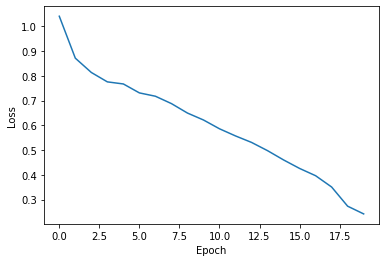

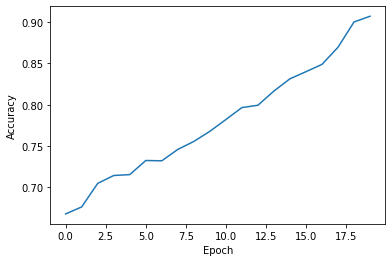

In [0]:
plt.plot(h_loss)
plt.xlabel('Epoch')
plt.ylabel('Loss')
# plt.ylim([0, 0.5])
plt.show()

plt.plot(h_acc)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
# plt.ylim([0.5, 1])
plt.show()
# filename = 'model_with_dropout20.pickle'
# with open(filename, "wb") as f:
#   pickle.dump([h_loss, h_acc], f)

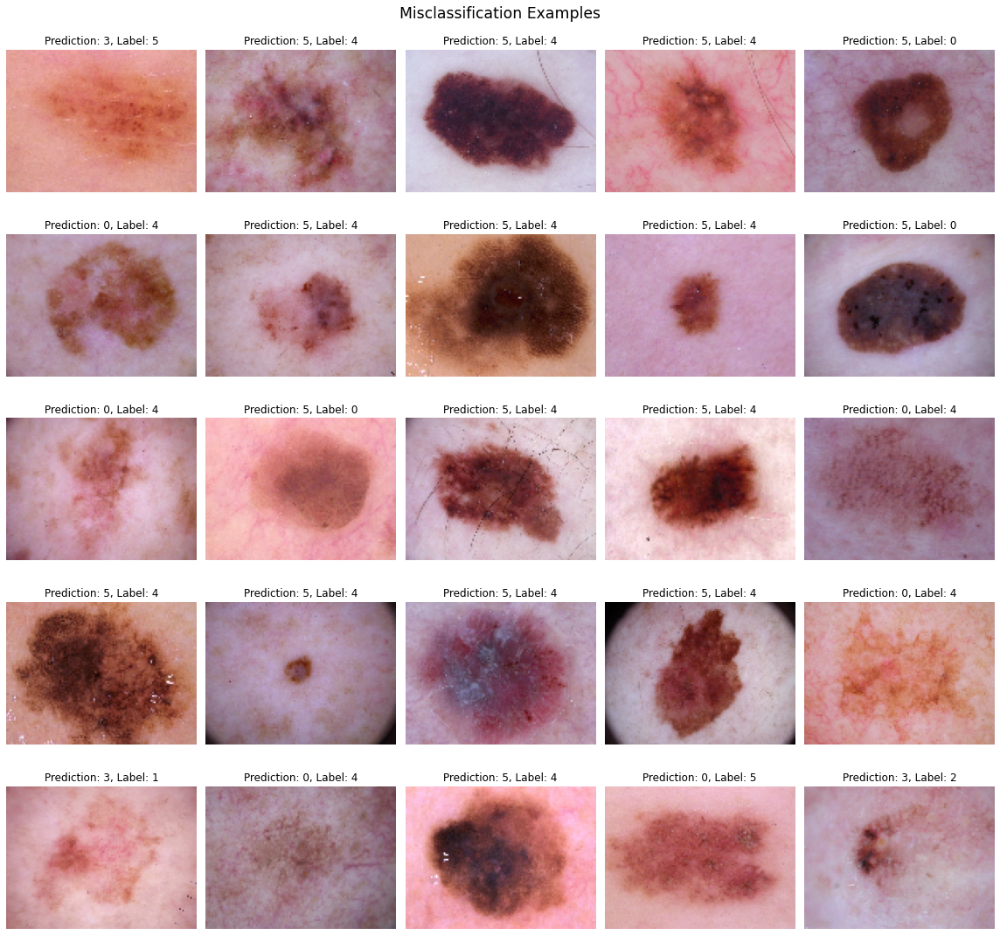

In [0]:
# display of misclassification
# (x_train - x_train_mean)/x_train_std

i = 1
plt.figure(figsize=(16, 16))
for images, labels in train_ds:
  predictions = model(images)
  predictions = predictions.numpy()
  labels = labels.numpy()
  misclassified_labels = np.where(tf.argmax(predictions, 1) != labels)[0]
  for j in range(len(misclassified_labels)):
    plt.subplot(5, 5, i)
    plt.imshow(np.array(images[misclassified_labels[j], :, :, :]*x_train_std+x_train_mean, dtype=np.int32))
    # plt.imshow(images[misclassified_labels[j], :, :, :].numpy())
    plt.title("Prediction: {}, Label: {}".format(tf.argmax(predictions, 1)[misclassified_labels[j]], labels[misclassified_labels[j]]))
    plt.axis('off')
    i += 1
    if i > 25:
      break
  if i > 25:
      break
plt.suptitle('Misclassification Examples', size="xx-large")
plt.tight_layout(rect=[0, 0.03, 1, 0.97])

In [0]:
# display of confusion matrix
y_predict = np.zeros_like(y_train)
y_label = np.zeros_like(y_train)
idx = 0
for images, labels in train_ds:
  predictions = model(images)
  predictions = predictions.numpy()
  predictions = tf.argmax(predictions, 1)
  j = 0
  for i in predictions:
    y_predict[idx] = i
    y_label[idx] = labels[j]
    idx += 1
    j += 1


In [0]:
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = np.max(cm) / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],   # x (1-j), y (0-i), s (text)
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

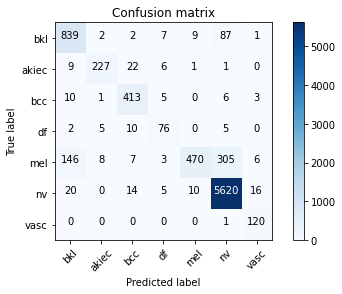

In [0]:
confusion_mtx = tf.math.confusion_matrix(y_label, y_predict).numpy()
plot_labels = ['bkl', 'akiec', 'bcc', 'df', 'mel', 'nv', 'vasc']
plot_confusion_matrix(confusion_mtx, plot_labels)

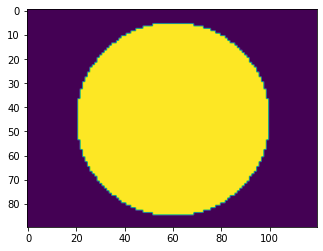

In [0]:
#### Physical Layer ####
illumination_phase = tf.Variable(initial_value=tf.ones([90, 120], tf.float32)*np.pi, dtype=tf.float32, trainable = True)

radius = 40
mask = np.zeros((90, 120))
ctri = round(mask.shape[0]/2)
ctrj = round(mask.shape[1]/2)
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if (ctri-i)**2 + (ctrj-j)**2 < radius**2:
            mask[i,j] = 1
circ_aper = tf.constant(mask, dtype=tf.int8)
aperture_phase = tf.Variable(initial_value=tf.ones([90, 120], tf.float32)*np.pi, dtype=tf.float32, trainable = True)

plt.imshow(abs(circ_aper))
plt.show()


def physical_layer(x_batch, illumination_phase=illumination_phase, circ_aper=circ_aper, aperture_phase=aperture_phase):
  inputs = tf.cast(x_batch, tf.complex64)
  inputs = tf.transpose(inputs, [0, 3, 1, 2])

  illumination_phase = tf.cast(illumination_phase, tf.complex64)
  illumination = tf.exp(1j*illumination_phase)

  circ_aper = tf.cast(circ_aper, tf.complex64)
  aperture_phase = tf.cast(aperture_phase, tf.complex64)
  aperture = circ_aper * tf.exp(1j*aperture_phase)

  emerging_field = tf.einsum('ijkl, kl->ijkl', inputs, illumination)
  field_fft = tf.signal.fftshift(tf.signal.fft2d(emerging_field))
  field_fltred_fft = tf.einsum('ijkl,kl->ijkl', field_fft, aperture)
  field = tf.signal.ifft2d(tf.signal.ifftshift(field_fltred_fft))

  field = (tf.abs(field))**2

  image = tf.transpose(field, [0, 2, 3, 1])
  image = tf.cast(image, tf.float32)
  
  return image


class ColorWeighing(tf.keras.layers.Layer):
  def __init__(self, activation, n):
    super().__init__()
    self.activation = activation
    self.n = n
  def build(self, input_shape):
    self.W = tf.Variable(initial_value=
                         tf.random.truncated_normal([input_shape[3]]), dtype=tf.float32, name=self.n+'W')
    self.b = tf.Variable(initial_value=
                         tf.random.truncated_normal([input_shape[3]]), dtype=tf.float32, name=self.n+'b')

  def call(self, input):
    output = tf.einsum('ijkl,l->ijkl', input, self.W)  # weighing different color
    # output = tf.einsum('ijkl,l->ijk', input, self.W)  # creating grayscale imaging
    # output = tf.expand_dims(output, -1)
    self.add_loss(-tf.minimum(tf.reduce_min(self.W), 0))  # regularizer, forcing W to be non-negative
    return self.activation(output + self.b[None])

  def get_config(self):
    config = super().get_config().copy()
    config.update({
        'activation': self.activation
    })


# class illumination(tf.keras.layers.Layer):
#   def __init__(self, activation, n):
#     super().__init__()
#     self.activation = activation
#     self.n = n


#   def build(self, input_shape):
#     self.angle = tf.Variable(initial_value=
#                          tf.random.normal([2]), dtype=tf.float32, name=self.n+'angle')
#     self.b = tf.Variable(initial_value=
#                          tf.random.normal([input_shape[3]]), dtype=tf.float32, name=self.n+'b') # shape should be a 1-D vector, remember to use bracket to encapsulate
#     self.wavelength = .5e-3          # units are mm
#     delta = .5 * self.wavelength
#     xsize = input_shape[2]
#     ysize = input_shape[1]
#     xstarting_coordinate = (-xsize/2) * delta
#     xending_coordinate = (xsize/2 - 1) * delta
#     ystarting_coordinate = (-ysize/2) * delta
#     yending_coordinate = (ysize/2 - 1) * delta
#     x = tf.linspace(xstarting_coordinate, xending_coordinate, xsize)
#     y = tf.linspace(ystarting_coordinate, yending_coordinate, ysize)
#     self.xx, self.yy = tf.meshgrid(x, y)

#     diameter = input_shape[2]/2
#     radius = diameter/2
#     mask = np.zeros((input_shape[1], input_shape[2]))
#     ctri = round(mask.shape[0]/2)
#     ctrj = round(mask.shape[1]/2)
#     for i in range(mask.shape[0]):
#         for j in range(mask.shape[1]):
#             if (ctri-i)**2 + (ctrj-j)**2 < radius**2:
#                 mask[i,j] = 1
    
#     self.aperture = tf.Variable(initial_value=mask, dtype=tf.float32, name=self.n+'aperture')


#   def call(self, input):
#     input = tf.cast(input, tf.complex64)
#     aperture = tf.cast(self.aperture, tf.complex64)
#     xx = tf.cast(self.xx, tf.complex64)
#     yy = tf.cast(self.yy, tf.complex64)

#     sample = tf.transpose(input, [0, 3, 1, 2])
#     sample_phase = sample
#     sample = sample * tf.math.exp(1j * 2 * np.pi * sample_phase * 5)

#     plane_wave_angle_x = self.angle[0] * np.pi/180
#     plane_wave_angle_y = self.angle[1] * np.pi/180
#     plane_wave_angle_x = tf.cast(plane_wave_angle_x, tf.complex64)
#     plane_wave_angle_y = tf.cast(plane_wave_angle_y, tf.complex64)

#     illumination_plane_wave = tf.math.exp(1j*2*np.pi/self.wavelength * (tf.math.sin(plane_wave_angle_x) * xx + tf.math.sin(plane_wave_angle_y) * yy))
#     emerging_field = tf.einsum('ijkl,kl->ijkl', sample, illumination_plane_wave)  # fftshift
#     sample_fft = tf.signal.fft2d(emerging_field)
                
#     sample_fltred_fft = tf.einsum('ijkl,kl->ijkl', sample_fft, aperture)

#     sample_fltred = tf.signal.ifft2d(sample_fltred_fft)
#     sample_fltred = (tf.abs(sample_fltred))**2
    
#     sample_fltred = tf.transpose(sample_fltred, [0, 2, 3, 1])
#     output = tf.cast(sample_fltred, tf.float32)

#     return self.activation(output + self.b[None])

#   def get_config(self):
#     config = super().get_config().copy()
#     config.update({
#         'activation': self.activation
#     })

In [0]:
# #### Model Class ####

# # regularization?
# class cnn_model(tf.keras.models.Model):  # 6-8 is the sweet point
#   def __init__(self):
#     super().__init__()
#     # self.illuminate = illumination(activation=tf.nn.relu, n='physical1')
#     self.colorweighing = ColorWeighing(activation=tf.nn.relu, n='physical2')
#     self.conv1 = tf.keras.layers.Conv2D(16, 3, padding="same", activation="relu")
#     self.conv2 = tf.keras.layers.Conv2D(16, 3, 2, padding="same", activation="relu")
#     self.noise = tf.keras.layers.GaussianNoise(1)  # noise regularization
#     self.norm1 = tf.keras.layers.BatchNormalization()
#     self.conv3 = tf.keras.layers.Conv2D(16, 3, padding="same", activation="relu")
#     self.conv4 = tf.keras.layers.Conv2D(16, 3, 2, padding="same", activation="relu")
#     self.norm2 = tf.keras.layers.BatchNormalization()
#     self.flatten = tf.keras.layers.Flatten()
#     self.dense = tf.keras.layers.Dense(128, activation="relu")
#     self.drop = tf.keras.layers.GaussianDropout(0.2)  # dropout
#     self.out = tf.keras.layers.Dense(7, activation="softmax")

#   def call(self, x):
#     # x = self.illuminate(x)
#     x = self.colorweighing(x)
#     x = self.conv1(x)
#     x = self.conv2(x)
#     x = self.noise(x)  # noise regularization, decrease acc strongly
#     x = self.norm1(x)
#     x = self.conv3(x)
#     x = self.conv4(x)
#     x = self.norm2(x)
#     flat = self.flatten(x)
#     x = self.dense(flat)
#     x = self.drop(x)  # dropout
#     return self.out(x)

class cnn_model(tf.keras.models.Model):
  def __init__(self):
    super().__init__()
    self.colorweighing = ColorWeighing(activation=tf.nn.relu, n='physical2')
    self.conv1 = tf.keras.layers.Conv2D(64, 3, padding="same", activation="relu")
    self.maxpool1 = tf.keras.layers.MaxPool2D((2, 2), 2, padding='valid')
    self.norm1 = tf.keras.layers.BatchNormalization()
    self.conv2 = tf.keras.layers.Conv2D(128, 3, padding="same", activation="relu")
    self.maxpool2 = tf.keras.layers.MaxPool2D((2, 2), 2, padding='valid')
    self.norm2 = tf.keras.layers.BatchNormalization()
    self.drop1 = tf.keras.layers.Dropout(0.2)  # dropout
    self.conv3 = tf.keras.layers.Conv2D(256, 3, padding="same", activation="relu")
    self.conv4 = tf.keras.layers.Conv2D(256, 3, padding="same", activation="relu")
    self.conv5 = tf.keras.layers.Conv2D(256, 3, padding="same", activation="relu")
    self.maxpool3 = tf.keras.layers.MaxPool2D((2, 2), 2, padding='valid')
    self.norm3 = tf.keras.layers.BatchNormalization()
    self.drop2 = tf.keras.layers.Dropout(0.25)  # dropout
    self.conv6 = tf.keras.layers.Conv2D(512, 3, padding="same", activation="relu")
    self.conv7 = tf.keras.layers.Conv2D(512, 3, padding="same", activation="relu")
    self.conv8 = tf.keras.layers.Conv2D(512, 3, padding="same", activation="relu")
    self.maxpool4 = tf.keras.layers.MaxPool2D((2, 2), 2, padding='valid')
    self.norm4 = tf.keras.layers.BatchNormalization()
    self.conv9 = tf.keras.layers.Conv2D(512, 3, padding="same", activation="relu")
    self.conv10 = tf.keras.layers.Conv2D(512, 3, padding="same", activation="relu")
    self.conv11 = tf.keras.layers.Conv2D(512, 3, padding="same", activation="relu")
    self.maxpool5 = tf.keras.layers.MaxPool2D((2, 2), 2, padding='valid')
    self.norm5 = tf.keras.layers.BatchNormalization()
    self.drop3 = tf.keras.layers.Dropout(0.4)  # dropout
    self.flatten = tf.keras.layers.Flatten()
    self.dense1 = tf.keras.layers.Dense(4096, activation="relu")
    self.dense2 = tf.keras.layers.Dense(4096, activation="relu")
    self.drop4 = tf.keras.layers.Dropout(0.5)  # dropout
    self.out = tf.keras.layers.Dense(7, activation="softmax")

  def call(self, x):
    x = self.colorweighing(x)
    x = self.conv1(x)
    x = self.maxpool1(x)
    x = self.norm1(x)
    x = self.conv2(x)
    x = self.maxpool2(x)
    x = self.norm2(x)
    x = self.drop1(x)
    x = self.conv3(x)
    x = self.conv4(x)
    x = self.conv5(x)
    x = self.maxpool3(x)
    x = self.norm3(x)
    x = self.drop2(x)
    x = self.conv6(x)
    x = self.conv7(x)
    x = self.conv8(x)
    x = self.maxpool4(x)
    x = self.norm4(x)
    x = self.conv9(x)
    x = self.conv10(x)
    x = self.conv11(x)
    x = self.maxpool5(x)
    x = self.norm5(x)
    x = self.drop3(x)
    flat = self.flatten(x)
    x = self.dense1(flat)
    x = self.dense2(x)
    x = self.drop4(x)
    return self.out(x)



In [0]:
model = cnn_model()

In [0]:
loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
optimizer = tf.optimizers.Adam(0.0001)

train_loss = tf.keras.metrics.Mean(name="train_loss")  # it will accumulate
train_acc = tf.keras.metrics.SparseCategoricalAccuracy(name="train_acc")  # it will accumulate

test_loss = tf.keras.metrics.Mean(name="test_loss")
test_acc = tf.keras.metrics.SparseCategoricalAccuracy(name="test_acc")


In [0]:
def forward_model(x_batch):
  p_layer_out = physical_layer(x_batch)
  return model(p_layer_out)

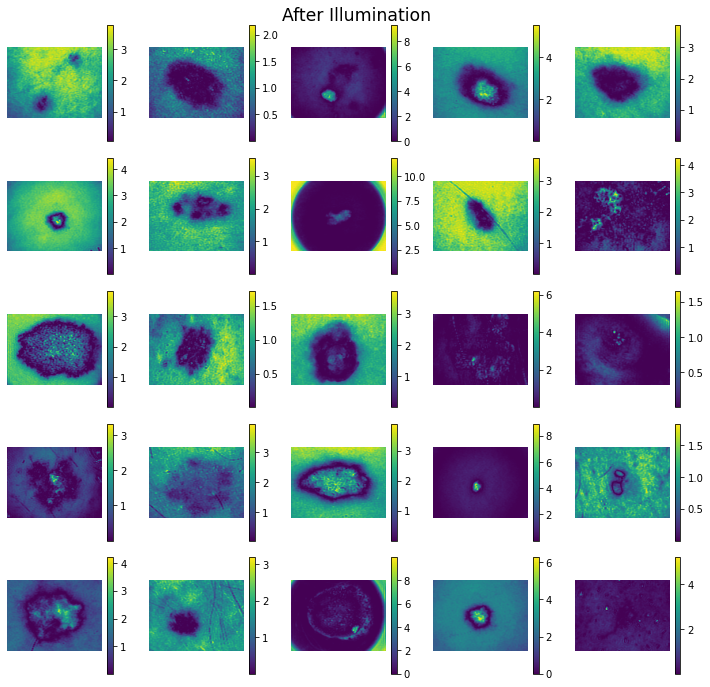

In [0]:
def plot_examples(batch):
    plt.figure(figsize=(10, 10))
    for i in range(25):
        plt.subplot(5, 5, i+1)
        plt.imshow(batch[i, :, :, 0])
        plt.colorbar()
        plt.axis('off')
    plt.suptitle("After Illumination", size="xx-large")
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])

plot_examples(physical_layer(x_train[:25]))

In [0]:
#################################
#         Training API          #
#################################
@tf.function  # preserve gradients, otherwise explicitly tape.watch(var)
def train_step(images, labels):
  with tf.GradientTape() as tape:  # record operations for automatic differentiation
    predictions = forward_model(images)
    loss = loss_object(labels, predictions)  # calculate loss
    
  trainable_var = model.trainable_variables
  trainable_var.append(illumination_phase)
  trainable_var.append(aperture_phase)
  gradients = tape.gradient(loss, trainable_var)  # get gradients of trainable variables with respect to loss via tape
  optimizer.apply_gradients(zip(gradients, trainable_var))  # use gradients to update trainable variables via optimizer

  train_loss(loss)
  train_acc(labels, predictions)


In [0]:
@tf.function  # preserve gradients
def test_step(images, labels):  # no updates needed for test
  predictions = forward_model(images)
  T_loss = loss_object(labels, predictions)

  test_loss(T_loss)
  test_acc(labels, predictions)

In [0]:
h_loss = []
h_acc = []
EPOCHS = 20
for epoch in range(EPOCHS):
  for images, labels in train_ds:
    train_step(images, labels)
  print('EPOCH: {}, Loss: {}, Accuracy: {}'.format(epoch+1, train_loss.result(), train_acc.result()))
  for images, labels in test_ds:
    test_step(images, labels)
  print('Loss: {}, Accuracy: {}'.format(test_loss.result(), test_acc.result()))
  h_loss.append(float(train_loss.result()))
  h_acc.append(float(train_acc.result()))
  train_loss.reset_states()  # reset after completion of each epoch
  train_acc.reset_states()  # reset after completion of each epoch



EPOCH: 1, Loss: 1.108432412147522, Accuracy: 0.6604706048965454
Loss: 0.9993512630462646, Accuracy: 0.6732673048973083
EPOCH: 2, Loss: 0.9492168426513672, Accuracy: 0.672705888748169
Loss: 0.9725313782691956, Accuracy: 0.6778877973556519
EPOCH: 3, Loss: 0.8984905481338501, Accuracy: 0.682941198348999
Loss: 0.9386856555938721, Accuracy: 0.6781077980995178
EPOCH: 4, Loss: 0.8476638793945312, Accuracy: 0.6912941336631775
Loss: 0.9198747277259827, Accuracy: 0.6813531517982483
EPOCH: 5, Loss: 0.8303559422492981, Accuracy: 0.6992940902709961
Loss: 0.9053289890289307, Accuracy: 0.6842244267463684
EPOCH: 6, Loss: 0.8151768445968628, Accuracy: 0.7002353072166443
Loss: 0.8936231136322021, Accuracy: 0.686578631401062
EPOCH: 7, Loss: 0.7955270409584045, Accuracy: 0.7084705829620361
Loss: 0.8814877867698669, Accuracy: 0.6893917918205261
EPOCH: 8, Loss: 0.7849087715148926, Accuracy: 0.7154117822647095
Loss: 0.8738016486167908, Accuracy: 0.6905115246772766
EPOCH: 9, Loss: 0.7751645445823669, Accuracy

In [0]:
for images, labels in test_ds:
  test_step(images, labels)
print('Loss: {}, Accuracy: {}'.format(test_loss.result(), test_acc.result()))

# model.save_weights('/content/drive/My Drive/model_with_dropout20_softmax.h5')

Loss: 0.8985096216201782, Accuracy: 0.7056105732917786


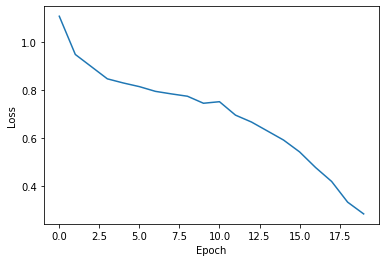

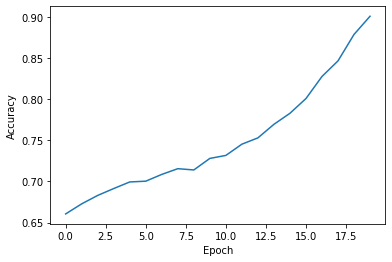

In [0]:
plt.plot(h_loss)
plt.xlabel('Epoch')
plt.ylabel('Loss')
# plt.ylim([0, 0.5])
plt.show()

plt.plot(h_acc)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
# plt.ylim([0.5, 1])
plt.show()
# filename = 'model_with_dropout20.pickle'
# with open(filename, "wb") as f:
#   pickle.dump([h_loss, h_acc], f)


If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.



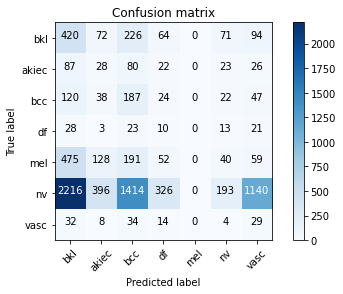

In [0]:
# display of confusion matrix
y_predict = np.zeros_like(y_train)
y_label = np.zeros_like(y_train)
idx = 0
for images, labels in train_ds:
  predictions = model(images)
  predictions = predictions.numpy()
  predictions = tf.argmax(predictions, 1)
  j = 0
  for i in predictions:
    y_predict[idx] = i
    y_label[idx] = labels[j]
    idx += 1
    j += 1

confusion_mtx = tf.math.confusion_matrix(y_label, y_predict).numpy()
plot_labels = ['bkl', 'akiec', 'bcc', 'df', 'mel', 'nv', 'vasc']
plot_confusion_matrix(confusion_mtx, plot_labels)

In [0]:
weights = model.layers[0].get_weights()[0]
weights  # for RGB

array([-1.3780233 , -0.25839037,  0.85009724], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

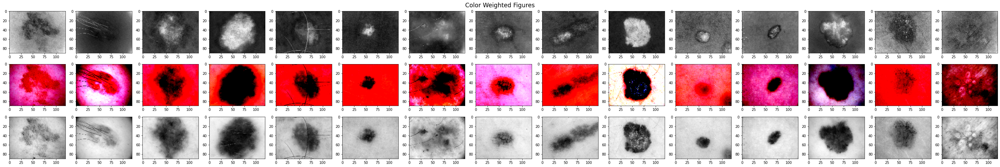

In [0]:
fig = plt.figure(figsize=(40, 7))
for idx, i in enumerate(images):
  if idx < 15:
    i = i.numpy()
    newi = np.zeros((i.shape[0], i.shape[1]))
    for j in range(3):
      newi += weights[j] * i[:, :, j]
    fig.add_subplot(3, 15, idx+1)
    plt.imshow(newi, cmap='gray')
    fig.add_subplot(3, 15, idx+16)
    plt.imshow(i)
    ig = .299*i[:,:,0] + .587*i[:,:,1] + .114*i[:,:,2] # rgb2gray
    fig.add_subplot(3, 15, idx+31)
    plt.imshow(ig, cmap='gray')
plt.suptitle('Color Weighted Figures', size="xx-large")
plt.tight_layout(rect=[0, 0.03, 1, 0.97])

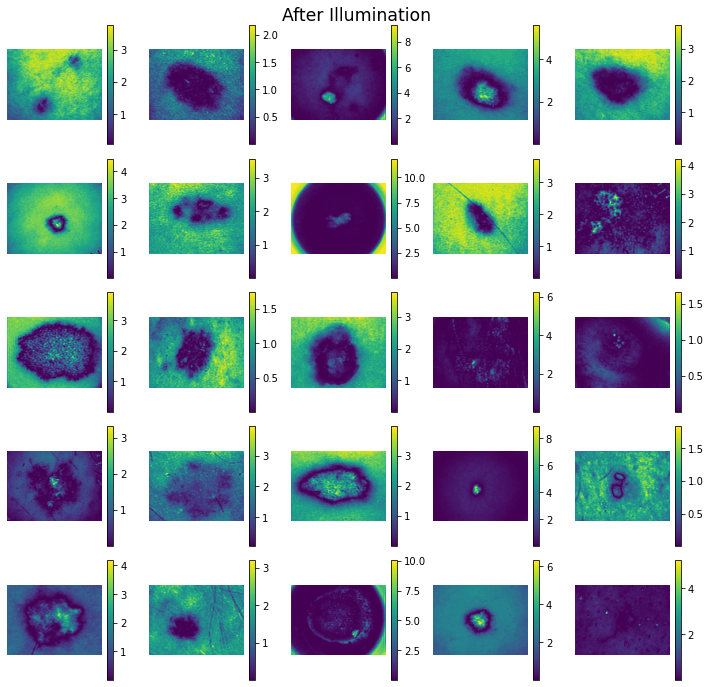

In [0]:
# plot examples 
plot_examples(physical_layer(x_train[:25]).numpy())

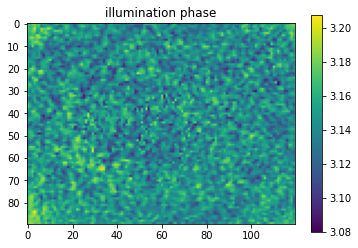

In [0]:
plt.imshow((illumination_phase).numpy())
plt.colorbar()
plt.title("illumination phase")
plt.show()

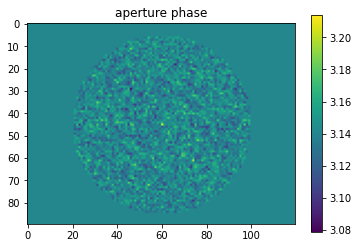

In [0]:
plt.imshow((aperture_phase).numpy())
plt.colorbar()
plt.title("aperture phase")
plt.show()

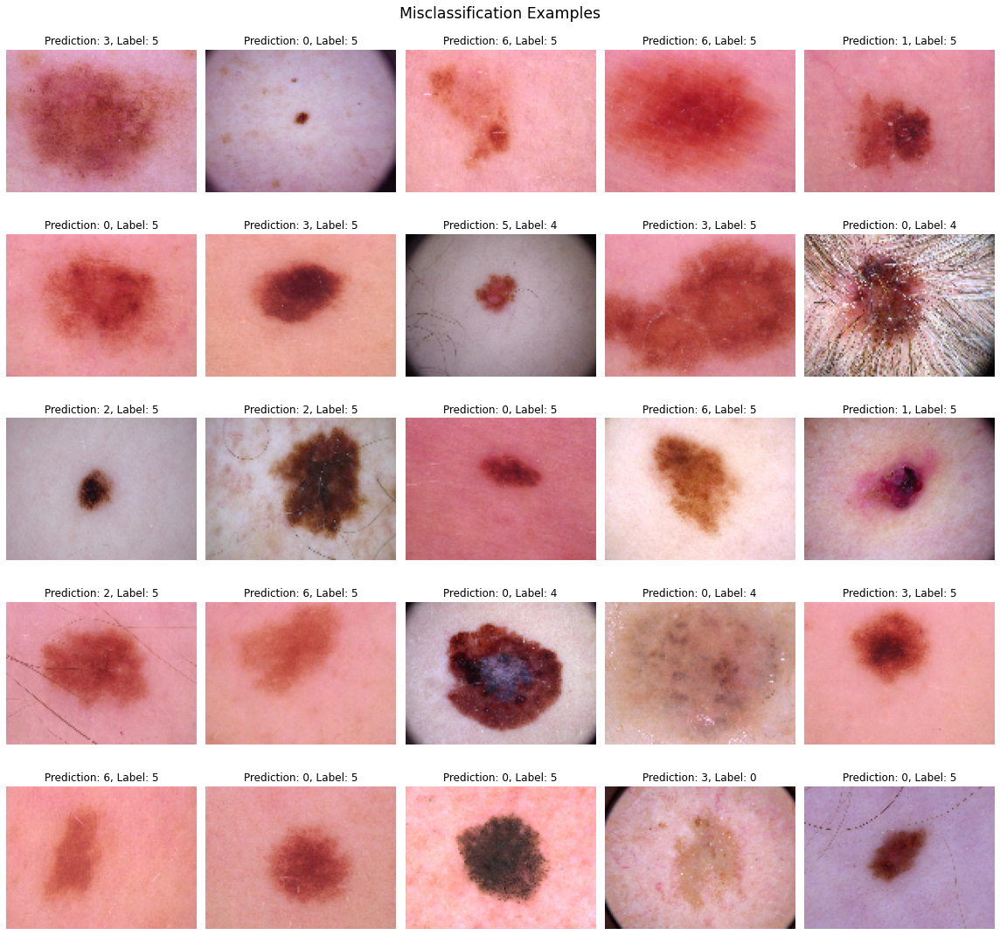

In [0]:
# display of misclassification

i = 1
plt.figure(figsize=(16, 16))
for images, labels in train_ds:
  predictions = model(images)
  predictions = predictions.numpy()
  labels = labels.numpy()
  misclassified_labels = np.where(tf.argmax(predictions, 1) != labels)[0]
  for j in range(len(misclassified_labels)):
    plt.subplot(5, 5, i)
    plt.imshow(np.array(images[misclassified_labels[j], :, :, :]*x_train_std+x_train_mean, dtype=np.int32))
    # plt.imshow(images[misclassified_labels[j], :, :, :].numpy())
    plt.title("Prediction: {}, Label: {}".format(tf.argmax(predictions, 1)[misclassified_labels[j]], labels[misclassified_labels[j]]))
    plt.axis('off')
    i += 1
    if i > 25:
      break
  if i > 25:
      break
plt.suptitle('Misclassification Examples', size="xx-large")
plt.tight_layout(rect=[0, 0.03, 1, 0.97])


In [0]:
# only training aperture phase

model = cnn_model()

In [0]:
loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
optimizer = tf.optimizers.Adam(0.0001)

train_loss = tf.keras.metrics.Mean(name="train_loss")  # it will accumulate
train_acc = tf.keras.metrics.SparseCategoricalAccuracy(name="train_acc")  # it will accumulate

test_loss = tf.keras.metrics.Mean(name="test_loss")
test_acc = tf.keras.metrics.SparseCategoricalAccuracy(name="test_acc")


In [0]:
#################################
#         Training API          #
#################################
@tf.function  # preserve gradients, otherwise explicitly tape.watch(var)
def train_step(images, labels):
  with tf.GradientTape() as tape:  # record operations for automatic differentiation
    predictions = forward_model(images)
    loss = loss_object(labels, predictions)  # calculate loss
    
  trainable_var = model.trainable_variables
  trainable_var.append(aperture_phase)
  gradients = tape.gradient(loss, trainable_var)  # get gradients of trainable variables with respect to loss via tape
  optimizer.apply_gradients(zip(gradients, trainable_var))  # use gradients to update trainable variables via optimizer

  train_loss(loss)
  train_acc(labels, predictions)


In [0]:
@tf.function  # preserve gradients
def test_step(images, labels):  # no updates needed for test
  predictions = forward_model(images)
  T_loss = loss_object(labels, predictions)

  test_loss(T_loss)
  test_acc(labels, predictions)

In [0]:
h_loss = []
h_acc = []
EPOCHS = 20  # 6-8 is the sweet point
for epoch in range(EPOCHS):
  for images, labels in train_ds:
    train_step(images, labels)
  print('EPOCH: {}, Loss: {}, Accuracy: {}'.format(epoch+1, train_loss.result(), train_acc.result()))
  for images, labels in test_ds:
    test_step(images, labels)
  print('Loss: {}, Accuracy: {}'.format(test_loss.result(), test_acc.result()))
  h_loss.append(float(train_loss.result()))
  h_acc.append(float(train_acc.result()))
  train_loss.reset_states()  # reset after completion of each epoch
  train_acc.reset_states()  # reset after completion of each epoch



EPOCH: 1, Loss: 1.1133712530136108, Accuracy: 0.6632941365242004
Loss: 1.0575236082077026, Accuracy: 0.6686468720436096
EPOCH: 2, Loss: 0.9705926775932312, Accuracy: 0.6703529357910156
Loss: 1.0002607107162476, Accuracy: 0.6778877973556519
EPOCH: 3, Loss: 0.9179883003234863, Accuracy: 0.6823529601097107
Loss: 0.9663985371589661, Accuracy: 0.6811881065368652
EPOCH: 4, Loss: 0.8849121332168579, Accuracy: 0.6868235468864441
Loss: 0.9414295554161072, Accuracy: 0.6834983229637146
EPOCH: 5, Loss: 0.8728734850883484, Accuracy: 0.6917647123336792
Loss: 0.9242171049118042, Accuracy: 0.6876567602157593
EPOCH: 6, Loss: 0.8532367944717407, Accuracy: 0.6995294094085693
Loss: 0.9241371154785156, Accuracy: 0.6880087852478027
EPOCH: 7, Loss: 0.8292157053947449, Accuracy: 0.703529417514801
Loss: 0.9114541411399841, Accuracy: 0.6914662718772888
EPOCH: 8, Loss: 0.8065818548202515, Accuracy: 0.7141176462173462
Loss: 0.9000105857849121, Accuracy: 0.6934818625450134
EPOCH: 9, Loss: 0.7929821610450745, Accur

In [0]:
for images, labels in test_ds:
  test_step(images, labels)
print('Loss: {}, Accuracy: {}'.format(test_loss.result(), test_acc.result()))

# model.save_weights('/content/drive/My Drive/model_with_dropout20_softmax.h5')

Loss: 0.953080952167511, Accuracy: 0.7017759084701538


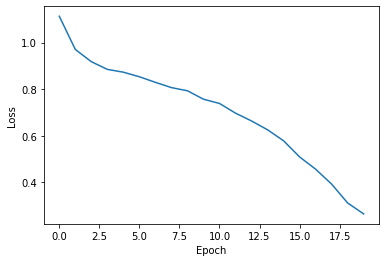

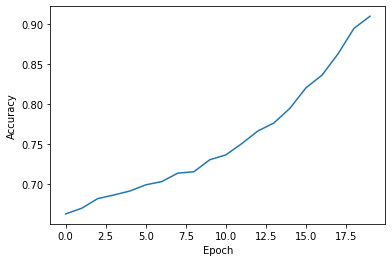

In [0]:
plt.plot(h_loss)
plt.xlabel('Epoch')
plt.ylabel('Loss')
# plt.ylim([0, 0.5])
plt.show()

plt.plot(h_acc)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
# plt.ylim([0.5, 1])
plt.show()
# filename = 'model_with_dropout20.pickle'
# with open(filename, "wb") as f:
#   pickle.dump([h_loss, h_acc], f)


If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.



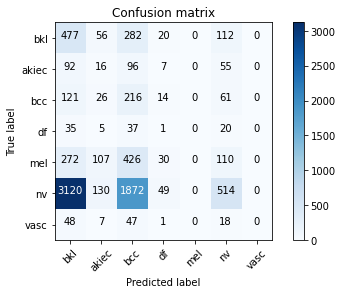

In [0]:
# display of confusion matrix
y_predict = np.zeros_like(y_train)
y_label = np.zeros_like(y_train)
idx = 0
for images, labels in train_ds:
  predictions = model(images)
  predictions = predictions.numpy()
  predictions = tf.argmax(predictions, 1)
  j = 0
  for i in predictions:
    y_predict[idx] = i
    y_label[idx] = labels[j]
    idx += 1
    j += 1

confusion_mtx = tf.math.confusion_matrix(y_label, y_predict).numpy()
plot_labels = ['bkl', 'akiec', 'bcc', 'df', 'mel', 'nv', 'vasc']
plot_confusion_matrix(confusion_mtx, plot_labels)

In [0]:
weights = model.layers[0].get_weights()[0]
weights  # for RGB

array([-1.4213184 ,  1.198979  , -0.09770616], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

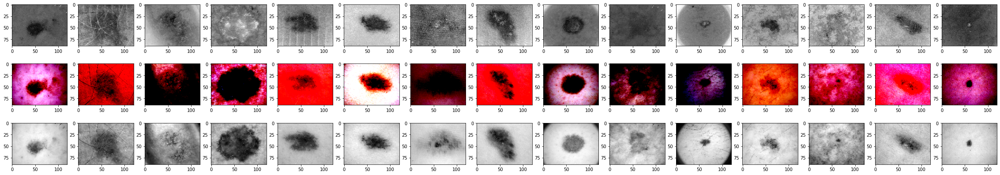

In [0]:
fig = plt.figure(figsize=(40, 7))
for idx, i in enumerate(images):
  if idx < 15:
    i = i.numpy()
    newi = np.zeros((i.shape[0], i.shape[1]))
    for j in range(3):
      newi += weights[j] * i[:, :, j]
    fig.add_subplot(3, 15, idx+1)
    plt.imshow(newi, cmap='gray')
    fig.add_subplot(3, 15, idx+16)
    plt.imshow(i)
    ig = .299*i[:,:,0] + .587*i[:,:,1] + .114*i[:,:,2] # rgb2gray
    fig.add_subplot(3, 15, idx+31)
    plt.imshow(ig, cmap='gray')
plt.show()
  

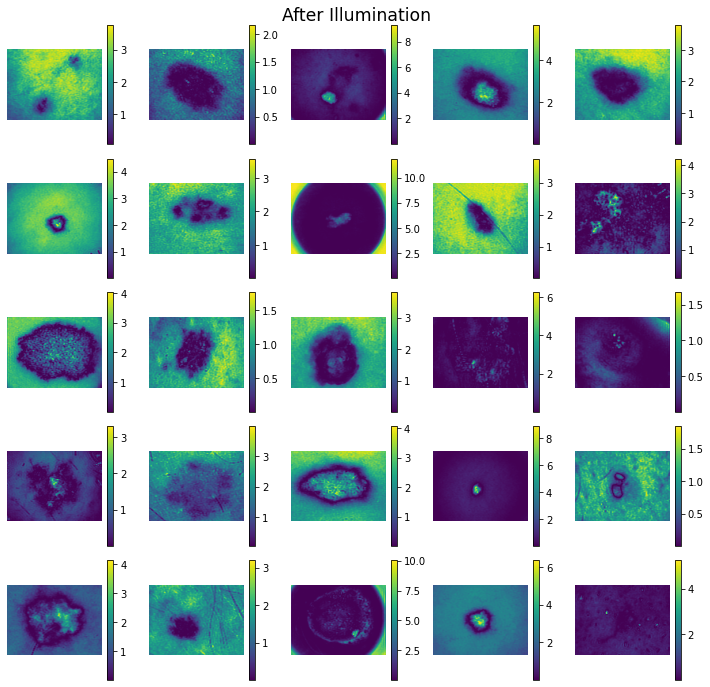

In [0]:
# plot examples 
plot_examples(physical_layer(x_train[:25]).numpy())

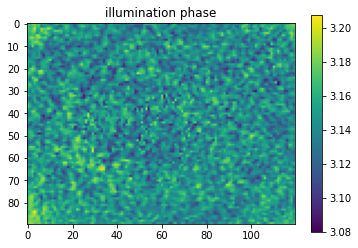

In [0]:
plt.imshow((illumination_phase).numpy())
plt.colorbar()
plt.title("illumination phase")
plt.show()

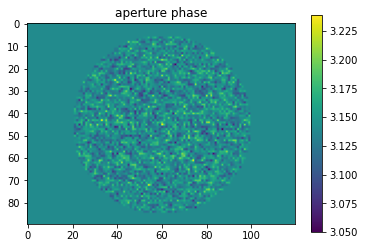

In [0]:
plt.imshow((aperture_phase).numpy())
plt.colorbar()
plt.title("aperture phase")
plt.show()

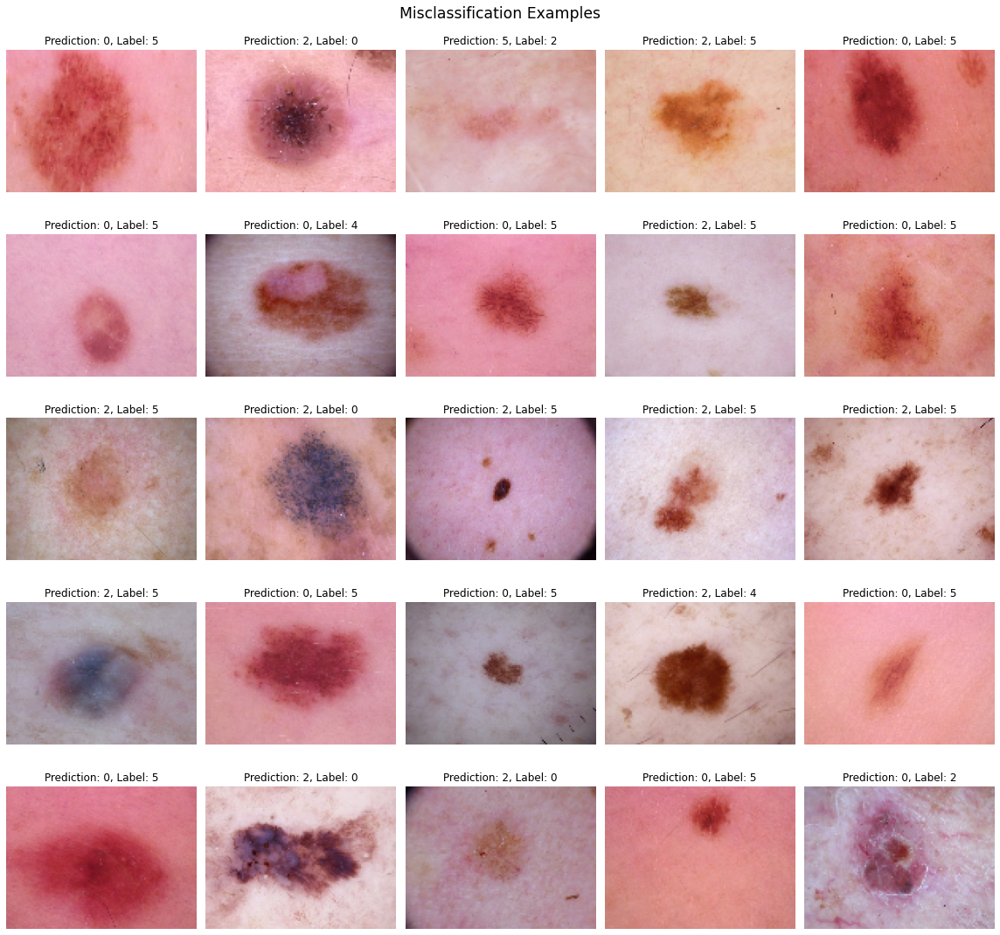

In [0]:
# display of misclassification

i = 1
plt.figure(figsize=(16, 16))
for images, labels in train_ds:
  predictions = model(images)
  predictions = predictions.numpy()
  labels = labels.numpy()
  misclassified_labels = np.where(tf.argmax(predictions, 1) != labels)[0]
  for j in range(len(misclassified_labels)):
    plt.subplot(5, 5, i)
    plt.imshow(np.array(images[misclassified_labels[j], :, :, :]*x_train_std+x_train_mean, dtype=np.int32))
    # plt.imshow(images[misclassified_labels[j], :, :, :].numpy())
    plt.title("Prediction: {}, Label: {}".format(tf.argmax(predictions, 1)[misclassified_labels[j]], labels[misclassified_labels[j]]))
    plt.axis('off')
    i += 1
    if i > 25:
      break
  if i > 25:
      break
plt.suptitle('Misclassification Examples', size="xx-large")
plt.tight_layout(rect=[0, 0.03, 1, 0.97])


In [0]:
# only training illumination phase

model = cnn_model()

In [0]:
loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
optimizer = tf.optimizers.Adam(0.0001)

train_loss = tf.keras.metrics.Mean(name="train_loss")  # it will accumulate
train_acc = tf.keras.metrics.SparseCategoricalAccuracy(name="train_acc")  # it will accumulate

test_loss = tf.keras.metrics.Mean(name="test_loss")
test_acc = tf.keras.metrics.SparseCategoricalAccuracy(name="test_acc")


In [0]:
#################################
#         Training API          #
#################################
@tf.function  # preserve gradients, otherwise explicitly tape.watch(var)
def train_step(images, labels):
  with tf.GradientTape() as tape:  # record operations for automatic differentiation
    predictions = forward_model(images)
    loss = loss_object(labels, predictions)  # calculate loss
    
  trainable_var = model.trainable_variables
  trainable_var.append(illumination_phase)
  gradients = tape.gradient(loss, trainable_var)  # get gradients of trainable variables with respect to loss via tape
  optimizer.apply_gradients(zip(gradients, trainable_var))  # use gradients to update trainable variables via optimizer

  train_loss(loss)
  train_acc(labels, predictions)


In [0]:
@tf.function  # preserve gradients
def test_step(images, labels):  # no updates needed for test
  predictions = forward_model(images)
  T_loss = loss_object(labels, predictions)

  test_loss(T_loss)
  test_acc(labels, predictions)

In [0]:
h_loss = []
h_acc = []
EPOCHS = 20
for epoch in range(EPOCHS):
  for images, labels in train_ds:
    train_step(images, labels)
  print('EPOCH: {}, Loss: {}, Accuracy: {}'.format(epoch+1, train_loss.result(), train_acc.result()))
  for images, labels in test_ds:
    test_step(images, labels)
  print('Loss: {}, Accuracy: {}'.format(test_loss.result(), test_acc.result()))
  h_loss.append(float(train_loss.result()))
  h_acc.append(float(train_acc.result()))
  train_loss.reset_states()  # reset after completion of each epoch
  train_acc.reset_states()  # reset after completion of each epoch



EPOCH: 1, Loss: 1.0954771041870117, Accuracy: 0.6596470475196838
Loss: 0.9839821457862854, Accuracy: 0.6732673048973083
EPOCH: 2, Loss: 0.9269478917121887, Accuracy: 0.6692941188812256
Loss: 0.9310705065727234, Accuracy: 0.6795379519462585
EPOCH: 3, Loss: 0.863844096660614, Accuracy: 0.689764678478241
Loss: 0.9007413387298584, Accuracy: 0.6844884753227234
EPOCH: 4, Loss: 0.8320624232292175, Accuracy: 0.6980000138282776
Loss: 0.8948805928230286, Accuracy: 0.6866336464881897
EPOCH: 5, Loss: 0.8217095732688904, Accuracy: 0.702470600605011
Loss: 0.8813331127166748, Accuracy: 0.6872607469558716
EPOCH: 6, Loss: 0.803405225276947, Accuracy: 0.7051764726638794
Loss: 0.8763144016265869, Accuracy: 0.6895489692687988
EPOCH: 7, Loss: 0.7836768627166748, Accuracy: 0.7131764888763428
Loss: 0.8643235564231873, Accuracy: 0.6926921010017395
EPOCH: 8, Loss: 0.7682086825370789, Accuracy: 0.7198823690414429
Loss: 0.8572115302085876, Accuracy: 0.6948844790458679
EPOCH: 9, Loss: 0.7533619403839111, Accuracy

In [0]:
for images, labels in test_ds:
  test_step(images, labels)
print('Loss: {}, Accuracy: {}'.format(test_loss.result(), test_acc.result()))

# model.save_weights('/content/drive/My Drive/model_with_dropout20_softmax.h5')

Loss: 0.8917927145957947, Accuracy: 0.7079679369926453


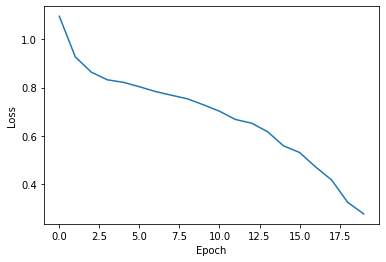

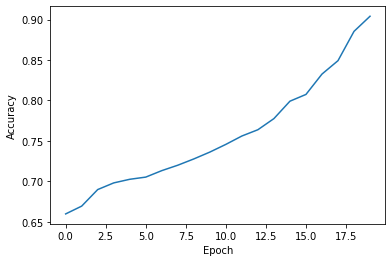

In [0]:
plt.plot(h_loss)
plt.xlabel('Epoch')
plt.ylabel('Loss')
# plt.ylim([0, 0.5])
plt.show()

plt.plot(h_acc)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
# plt.ylim([0.5, 1])
plt.show()
# filename = 'model_with_dropout20.pickle'
# with open(filename, "wb") as f:
#   pickle.dump([h_loss, h_acc], f)


If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.



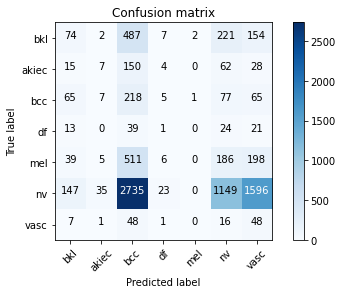

In [0]:
# display of confusion matrix
y_predict = np.zeros_like(y_train)
y_label = np.zeros_like(y_train)
idx = 0
for images, labels in train_ds:
  predictions = model(images)
  predictions = predictions.numpy()
  predictions = tf.argmax(predictions, 1)
  j = 0
  for i in predictions:
    y_predict[idx] = i
    y_label[idx] = labels[j]
    idx += 1
    j += 1

confusion_mtx = tf.math.confusion_matrix(y_label, y_predict).numpy()
plot_labels = ['bkl', 'akiec', 'bcc', 'df', 'mel', 'nv', 'vasc']
plot_confusion_matrix(confusion_mtx, plot_labels)

In [0]:
weights = model.layers[0].get_weights()[0]
weights  # for RGB

array([-1.1560372 , -0.61441654,  0.8077992 ], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

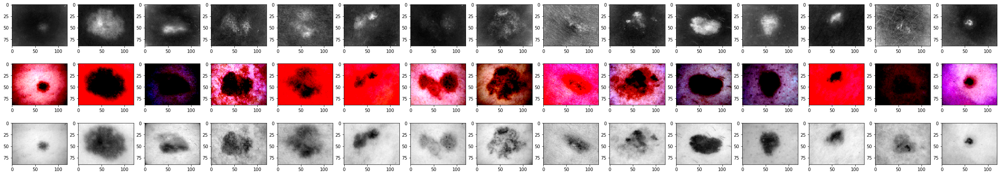

In [0]:
fig = plt.figure(figsize=(40, 7))
for idx, i in enumerate(images):
  if idx < 15:
    i = i.numpy()
    newi = np.zeros((i.shape[0], i.shape[1]))
    for j in range(3):
      newi += weights[j] * i[:, :, j]
    fig.add_subplot(3, 15, idx+1)
    plt.imshow(newi, cmap='gray')
    fig.add_subplot(3, 15, idx+16)
    plt.imshow(i)
    ig = .299*i[:,:,0] + .587*i[:,:,1] + .114*i[:,:,2] # rgb2gray
    fig.add_subplot(3, 15, idx+31)
    plt.imshow(ig, cmap='gray')
plt.show()
  

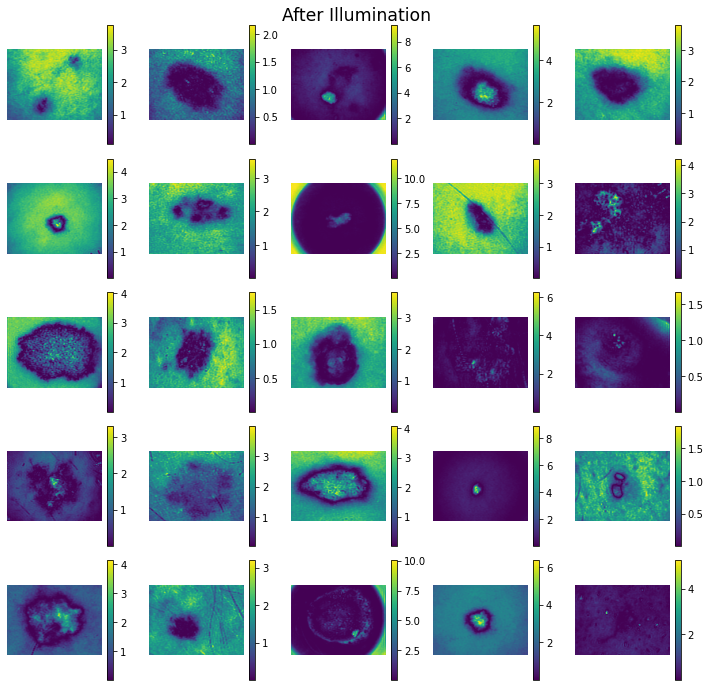

In [0]:
# plot examples 
plot_examples(physical_layer(x_train[:25]).numpy())

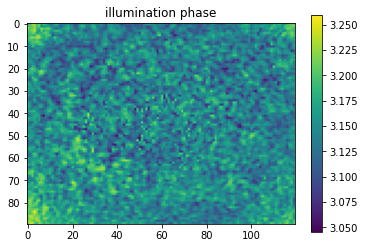

In [0]:
plt.imshow((illumination_phase).numpy())
plt.colorbar()
plt.title("illumination phase")
plt.show()

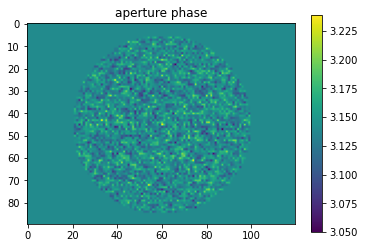

In [0]:
plt.imshow((aperture_phase).numpy())
plt.colorbar()
plt.title("aperture phase")
plt.show()

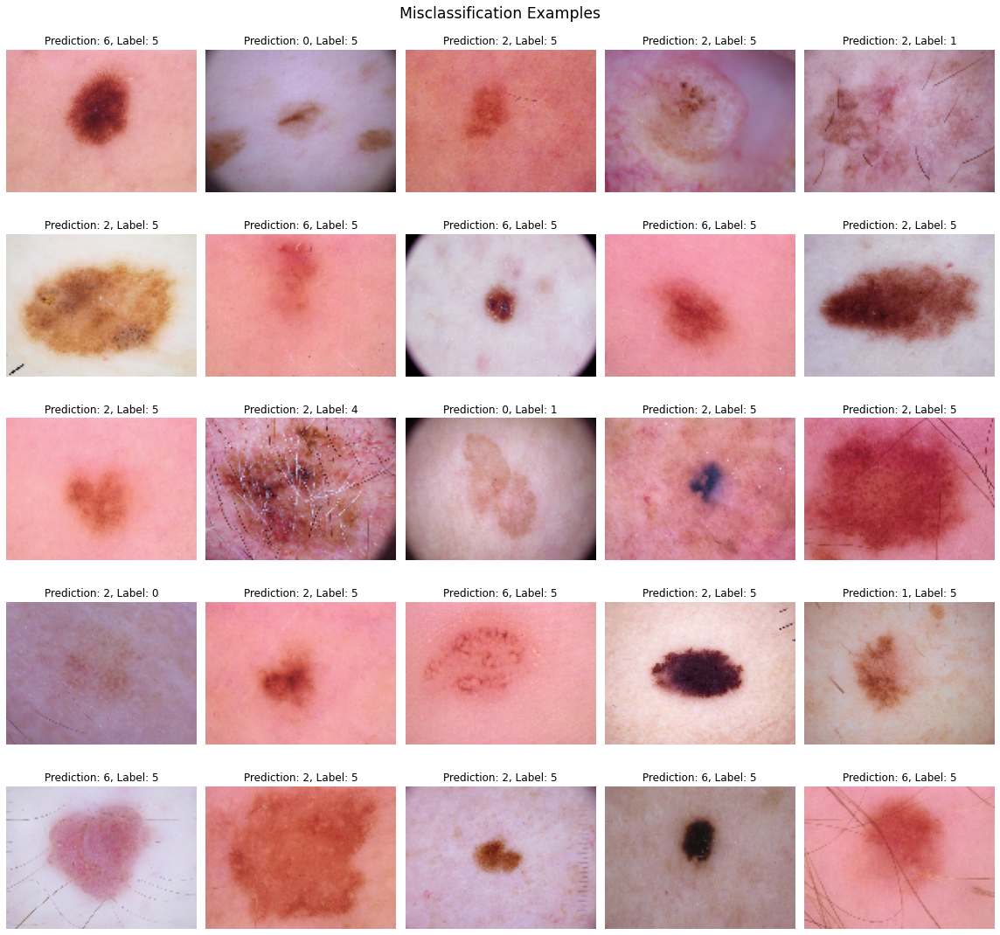

In [0]:
# display of misclassification

i = 1
plt.figure(figsize=(16, 16))
for images, labels in train_ds:
  predictions = model(images)
  predictions = predictions.numpy()
  labels = labels.numpy()
  misclassified_labels = np.where(tf.argmax(predictions, 1) != labels)[0]
  for j in range(len(misclassified_labels)):
    plt.subplot(5, 5, i)
    plt.imshow(np.array(images[misclassified_labels[j], :, :, :]*x_train_std+x_train_mean, dtype=np.int32))
    # plt.imshow(images[misclassified_labels[j], :, :, :].numpy())
    plt.title("Prediction: {}, Label: {}".format(tf.argmax(predictions, 1)[misclassified_labels[j]], labels[misclassified_labels[j]]))
    plt.axis('off')
    i += 1
    if i > 25:
      break
  if i > 25:
      break
plt.suptitle('Misclassification Examples', size="xx-large")
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
